<h1 style="text-align: center; font-weight: bold;">Notebook Peringkat [-1]</h1>
<h2 style="text-align: center;">Universitas Indonesia</h2>
<p style="text-align: center; font-weight: bold;">Oleh: Anthony, Arvin, Maul</p>
<p style="text-align: center; font-weight: bold;">Data Slayer 2.0 by</p>
<p style="text-align: center; font-weight: bold;">Program Studi Sains Data Telkom University, Purwokerto</p>

# Overview

## Background

<div style="font-family: Arial, sans-serif; line-height: 1.6; padding: 20px;">
  <p>
    Jatuh merupakan salah satu peristiwa yang sering kali berdampak serius bagi manusia, khususnya pada kelompok rentan seperti 
    <strong>lansia</strong>, <strong>pekerja di lingkungan berisiko tinggi</strong>, atau 
    <strong>individu dengan gangguan mobilitas</strong>. Berdasarkan data dari 
    <strong>Organisasi Kesehatan Dunia (WHO)</strong>, jatuh telah menjadi penyebab utama berbagai cedera serius, seperti 
    <strong>patah tulang</strong>, <strong>trauma kepala</strong>, hingga <strong>kematian dini</strong> pada kelompok tertentu. 
    Tidak hanya itu, insiden jatuh juga sering kali meninggalkan dampak psikologis, seperti <strong>rasa takut</strong> dan 
    <strong>kehilangan kepercayaan diri</strong>, yang pada akhirnya dapat menurunkan <em>kualitas hidup seseorang</em>.
  </p>

  <p>
    Oleh karena itu, <strong>deteksi dini</strong> dan <strong>akurasi dalam mengenali peristiwa jatuh</strong> sangatlah penting 
    sebagai upaya untuk meningkatkan keselamatan dan memberikan intervensi yang cepat.
  </p>

  <h3 style="font-weight: bold; color: #2C3E50;">Fall Detection: Teknologi Masa Depan untuk Keselamatan</h3>

  <p>
    <strong>Fall detection</strong> atau <strong>deteksi jatuh</strong> adalah teknologi yang memungkinkan identifikasi otomatis 
    peristiwa jatuh melalui <strong>sensor</strong> atau <strong>analisis data berbasis video dan citra</strong>. Dengan kemajuan teknologi 
    <strong>kecerdasan buatan (AI)</strong>, khususnya dalam bidang <strong>machine learning</strong>, deteksi jatuh kini dapat dilakukan 
    dengan lebih cepat dan akurat melalui <strong>pemrosesan citra</strong> dan <strong>pengembangan model klasifikasi berbasis data</strong>.
  </p>

  <p>
    Namun, teknologi ini menghadapi tantangan seperti:
  </p>
  <ul>
    <li><strong>Kekurangan data berkualitas</strong> yang merepresentasikan berbagai skenario jatuh.</li>
    <li><strong>Kesulitan membedakan antara kejadian jatuh</strong> dan aktivitas normal.</li>
    <li><strong>Keterbatasan model dalam menggeneralisasi</strong> untuk berbagai kondisi dunia nyata.</li>
  </ul>
</div>


# Dataset

Dataset terdiri dari 4294 data train dan 2152 data test. Setiap data merupakan satu frame foto seseorang, yang dapat diklasifikasikan menjadi fall (berpotensi untuk terjatuh) atau non-fall (tidak berpotensi untuk terjatuh). Banyaknya data fall dan non-fall memiliki rasio 1:2

Total gambar fall: 1546
Total gambar non_fall: 2748


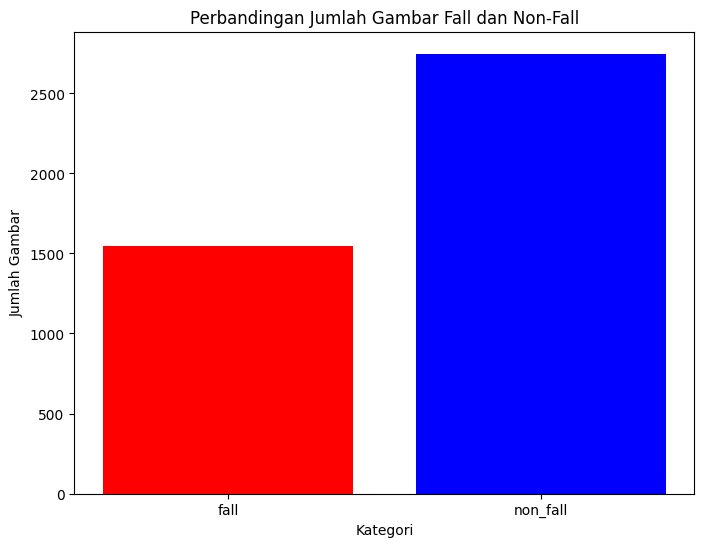

In [10]:
import os
import matplotlib.pyplot as plt

base_input_polos = '/kaggle/input/data-slayer-dataset/train'

categories = {
    "fall": [
        'backward_falls', 'forward_falls', 'left_falls', 'right_falls', 'sitting_falls', 'standing_falls'
    ],
    "non_fall": [
        'jumping', 'laying', 'picking', 'squat', 'stretching', 'walking'
    ]
}

total_counts = {"fall": 0, "non_fall": 0}

for subject_num in range(1, 5):
    subject_name = f'subject-{subject_num}'
    subject_input_dir = os.path.join(base_input_polos, subject_name)

    for category, activities in categories.items():
        category_input_dir = os.path.join(subject_input_dir, category)
        
        if not os.path.exists(category_input_dir):
            continue

        for activity in activities:
            activity_folder_name = f"{subject_num}_{activity}"
            activity_input_dir = os.path.join(category_input_dir, activity_folder_name)

            if not os.path.exists(activity_input_dir):
                continue  
                
            image_files = [
                f for f in os.listdir(activity_input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))
            ]
            total_counts[category] += len(image_files)

print(f"Total gambar fall: {total_counts['fall']}")
print(f"Total gambar non_fall: {total_counts['non_fall']}")

plt.figure(figsize=(8, 6))
plt.bar(total_counts.keys(), total_counts.values(), color=['red', 'blue'])
plt.title("Perbandingan Jumlah Gambar Fall dan Non-Fall")
plt.ylabel("Jumlah Gambar")
plt.xlabel("Kategori")
plt.show()

Pada train dataset, terdapat 4 subjek berbeda, dimana setiap subjek memiliki kumpulan foto yang terdiri dari dua kelas utama, antara fall atau non-fall. Pada kelas fall, subjek dapat diidentifikasi sebagai **backward falls**, **forward falls**, **left falls**, **right falls**, **sitting falls**, **standing falls** Sedangkan untuk kelas non-fall, subjek melakukan kegiatan antara lain **laying**, **picking**, **jumping**, **squat**, **stretching**, **walking**

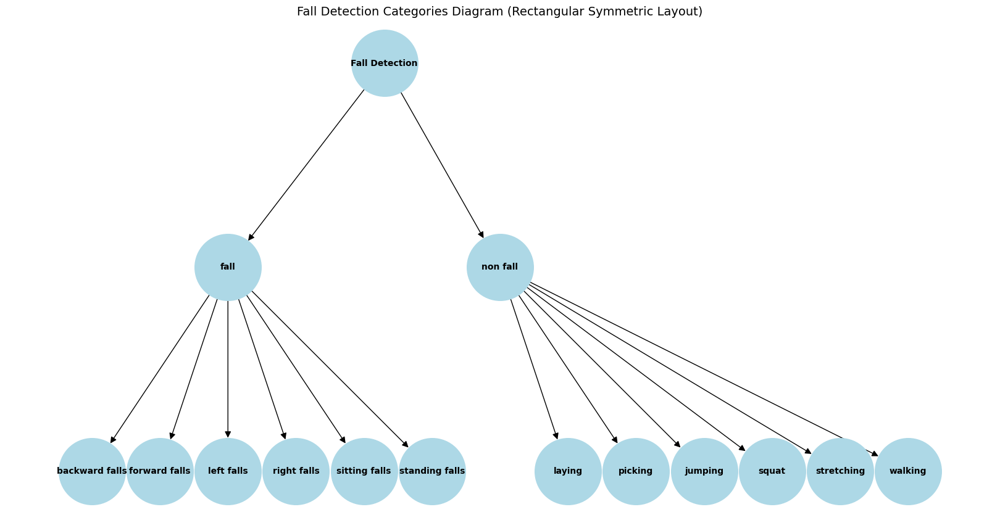

In [22]:
rectangular_pos = {
    "Fall Detection": (0.3, 4),
    "fall": (-2, 3),
    "non fall": (2, 3),
    "backward falls": (-4, 2),
    "forward falls": (-3, 2),
    "left falls": (-2, 2),
    "right falls": (-1, 2),
    "sitting falls": (0, 2),
    "standing falls": (1, 2),
    "laying": (3, 2),
    "picking": (4, 2),
    "jumping": (5, 2),
    "squat": (6, 2),
    "stretching": (7, 2),
    "walking": (8, 2),
}

plt.figure(figsize=(16, 8))
nx.draw(
    G,
    pos=rectangular_pos,
    with_labels=True,
    node_color="lightblue",
    node_size=6000,  
    font_size=10,
    font_weight="bold",
    arrows=True,
    arrowstyle="-|>",
    arrowsize=15,
)
plt.title("Fall Detection Categories Diagram (Rectangular Symmetric Layout)", fontsize=14)
plt.show()

Pada data train, terdapat 4 subject yang berbeda, yaitu **subject-1**, **subject-2**, **subject-3**, **subject-4**

## Exploratory Data Analysis Each Category

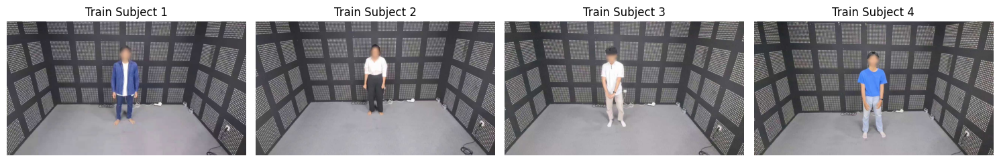

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
import os

image_paths = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/non_fall/1_stretching/frame000.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_stretching/frame000.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-3/non_fall/3_stretching/frame000.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-4/non_fall/4_stretching/frame000.jpg"
]

def plot_images(image_paths, title, rows=1):
    plt.figure(figsize=(15, 8))
    for i, image_path in enumerate(image_paths):
        if os.path.exists(image_path):
            img = Image.open(image_path)
            plt.subplot(rows, len(image_paths), i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{title} {i + 1}")
        else:
            print(f"Image not found: {image_path}")
    plt.tight_layout()
    plt.show()

plot_images(image_paths, title="Train Subject")

Sedangkan pada data **test**, hanya terdapat **2 jenis subject** dalam data tersebut

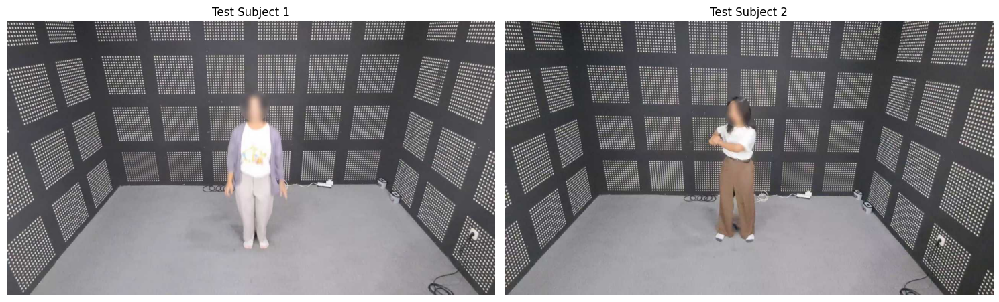

In [3]:
test_image_paths = [
    "/kaggle/input/data-slayer-dataset/test/004773d4e8.jpg",
    "/kaggle/input/data-slayer-dataset/test/017c62abe5.jpg"
]
plot_images(test_image_paths, title="Test Subject", rows=1)

### Category Falls

Setiap kategori fall ataupun non fall memiliki ciri khas nya sendiri yang dapat membantu model dalam mengidentifikasi, apakah suatu foto termasuk foto atau non fall. Berikut contohnya:

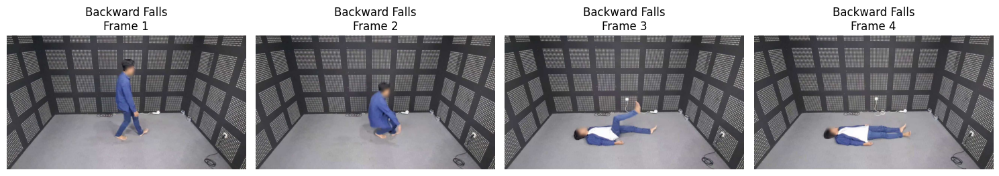

In [4]:
def plot_images(image_paths, title):
    plt.figure(figsize=(15, 5))
    for i, image_path in enumerate(image_paths):
        if os.path.exists(image_path):
            img = Image.open(image_path)
            plt.subplot(1, len(image_paths), i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{title}\nFrame {i + 1}")
        else:
            print(f"Image not found: {image_path}")
    plt.tight_layout()
    plt.show()

backward_falls = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_backward_falls/frame001.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_backward_falls/frame008.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_backward_falls/frame023.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_backward_falls/frame040.jpg",
]
plot_images(backward_falls, "Backward Falls")

Bisa dilihat bahwa pada *Backward Falls* terlihat beberapa karakteristik, seperti posisi kaki tidak sejajar. Selama kejadian jatuh ke belakang, individu cenderung kehilangan keseimbangan, menyebabkan posisi kaki menjadi tidak sejajar. Hal ini sejalan dengan penelitian yang menunjukkan bahwa jatuh ke belakang ditandai dengan perubahan signifikan dalam orientasi tubuh yang mempengaruhi posisi kaki. Selain itu, terdapat kecenderungan tubuh ke belakang. Pada kejadian tersebut, tubuh condong ke belakang saat jatuh, yang dapat diamati dari perubahan percepatan pada sumbu tertentu. Studi menggunakan sensor akselerometer menunjukkan bahwa jatuh ke belakang menghasilkan pola percepatan yang khas pada sumbu x, y, dan z.

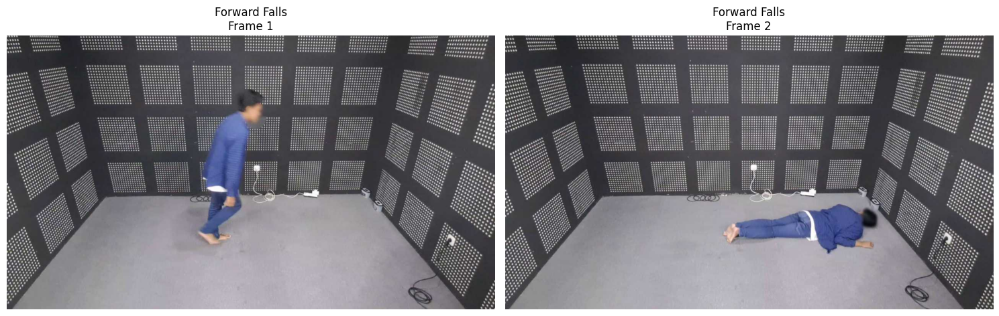

In [31]:
forward_falls = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_forward_falls/frame003.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_forward_falls/frame028.jpg",
]
plot_images(forward_falls, "Forward Falls")

Bisa dilihat pada *Forward Falls* memiliki beberapa karakteristik, seperti kecenderungan tubuh ke depan. Selama kejadian jatuh ke depan, individu cenderung memiliki tubuh yang condong ke depan, yang dapat menyebabkan hilangnya keseimbangan dan meningkatkan risiko cedera. Dan juga posisi tangan saat jatuh yang terlihat individu seringkali secara refleks menempatkan tangan di depan tubuh untuk menahan jatuh. Selain itu, jatuh ke depan akan menyebabkan seseorang terbaring dengan posisi tengkurep atau *prone*

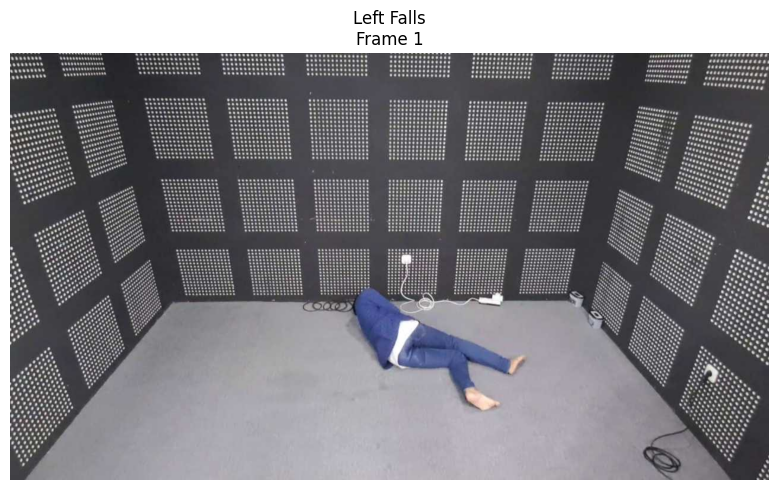

In [33]:
left_falls = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_left_falls/frame026.jpg",
]
plot_images(left_falls, "Left Falls")

Jatuh ke arah kiri atau *left falls* memiliki beberapa pola yang mencerminkan mekanisme khas dalam peristiwa jatuh manusia. Seringkali individu memiliki kecondongan tubuh ke arah kiri. Pada saat jatuh, tubuh cenderung condong ke arah kiri dengan distribusi berat badan yang tidak seimbang. Kecondongan ini sering terjadi akibat ketidakseimbangan gravitasi yang mempengaruhi orientasi tubuh secara horizontal. Selain itu, posisi tubuh tidak simetris. Saat individu jatuh, posisi tubuh, tangan, dan kaki sering kali tidak rapi. Tangan biasanya mencoba menahan jatuh, tetapi posisinya tetap tidak teratur. Pola ini mendukung refleks alami manusia untuk menahan benturan, terutama pada bagian tubuh yang rentan seperti kepala dan bahu. Serta, Left falls menunjukkan bahwa bagian kiri tubuh, termasuk pinggul, bahu, dan lengan, menerima sebagian besar dampak dari jatuh. Pola ini sering diidentifikasi dalam data akselerometer, di mana percepatan pada sumbu lateral (x-axis) menunjukkan nilai signifikan ketika jatuh ke kiri.

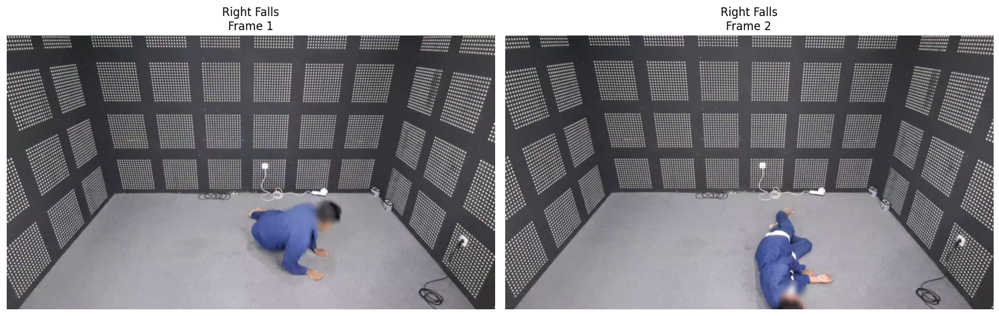

In [34]:
right_falls = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_right_falls/frame011.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_right_falls/frame028.jpg",
]
plot_images(right_falls, "Right Falls")

Jatuh ke arah kanan atau *right falls* memiliki pola yang serupa dengan jenis jatuh lateral lainnya, seperti *left falls*, tetapi dengan dampak utama pada sisi kanan tubuh. 

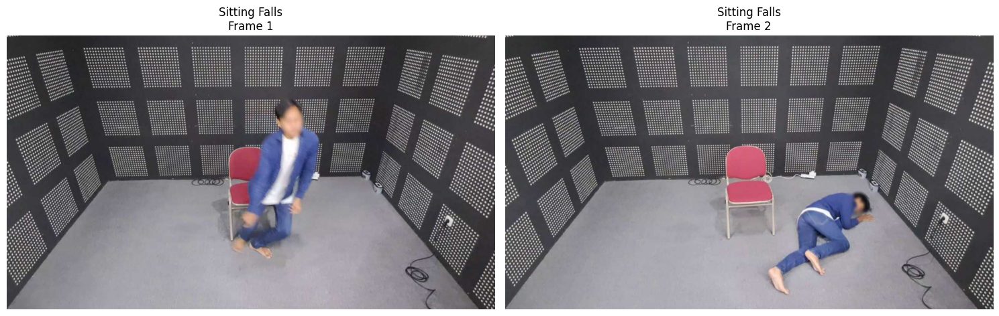

In [35]:
sitting_falls = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_sitting_falls/frame005.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_sitting_falls/frame028.jpg",
]
plot_images(sitting_falls, "Sitting Falls")

Pada data ini, memiliki ciri khas, yaitu objek kursi hanya terdapat pada kategori *sitting falls*. *Sitting falls* memiliki pola jatuh yang mirip dengan kategori yang lainnya. Namun, apabila terdapat kursi di gambar, maka subjek tersebut memiliki potensi untuk mengalami *sitting falls*

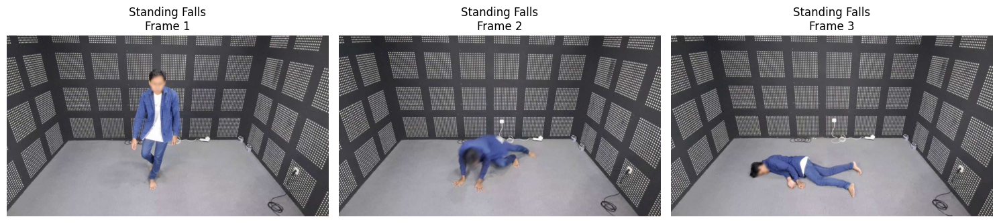

In [38]:
standing_falls = [
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_standing_falls/frame004.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_standing_falls/frame023.jpg",
    "/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_standing_falls/frame052.jpg",
]
plot_images(standing_falls, "Standing Falls")

*Standing falls* memiliki ciri khas, berupa subjek yang terlihat tidak seimbang namun tetap berada pada area central gambar atau tidak berubah dari posisi berdiri awal sebelumnya dan kemudian akan jatuh dan terbaring dengan posisi tubuh tidak simetris, baik ke kanan, kiri, depan, atau belakang

### Category Non Falls

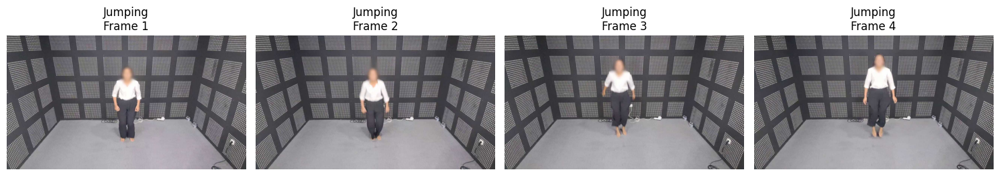

In [5]:
Jumping = [
'/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_jumping/frame012.jpg',
'/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_jumping/frame026.jpg',
'/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_jumping/frame059.jpg',
'/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_jumping/frame075.jpg',
]

plot_images(Jumping,'Jumping')

*Jumping* memiliki karaktersitik bahwa gambar cenderung stabil dengan kurangnya noise atau blur yang disebabkan oleh pergerakan individu. Serta, individu cenderung berada di 1 garis vertikal yang sama. Yang artinya inidvidu tersebut tidak bertambah tingkat keimiringannya 

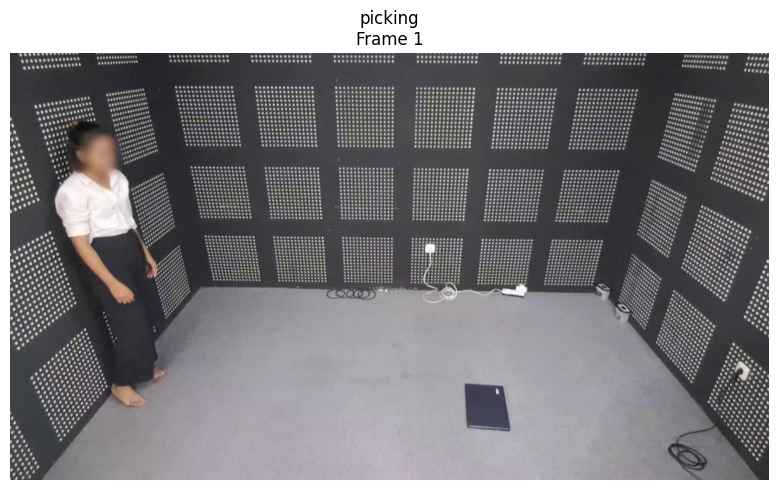

In [6]:
picking = ['/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_picking/frame012.jpg']
plot_images(picking,'picking')


*Picking* merupakan salah satu sub-kategori dari non-falls yang mudah untuk diidentifikasi karena hanya data *picking* yang di gambarnya terdapat objek di lantai.

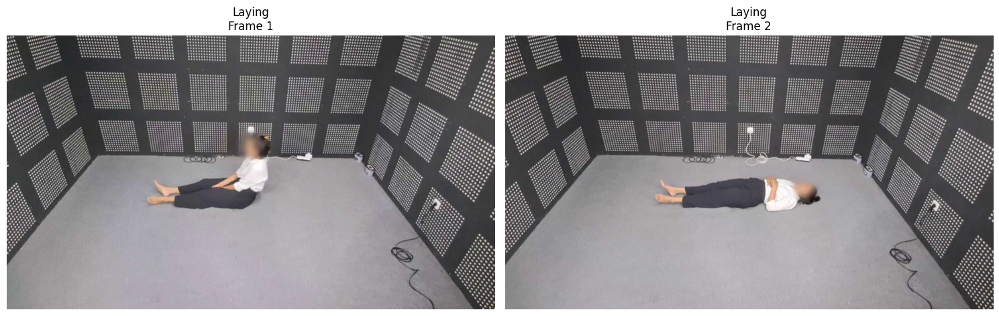

In [7]:
laying = [
'/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_laying/frame013.jpg',
'/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_laying/frame035.jpg'
]
plot_images(laying,'Laying')

*Laying* merupakan kategori yang dapat membantu model untuk membedakan mana berbaring yang diakibatkan oleh jatuh, dan mana yang merupakan kegiatan *laying*. Pada data, seorang individu yang terkategorisasi sebagai *laying* akan menempatkan kakinya sejajar dengan permukaan tanah. Dan pada saat berbaring, anggota tubuh, seperti badan, kaki, dan tangan cenderung ditempatkan di posisi yang seharusnya, seperti tangan tidak terlalu melebar dari badan

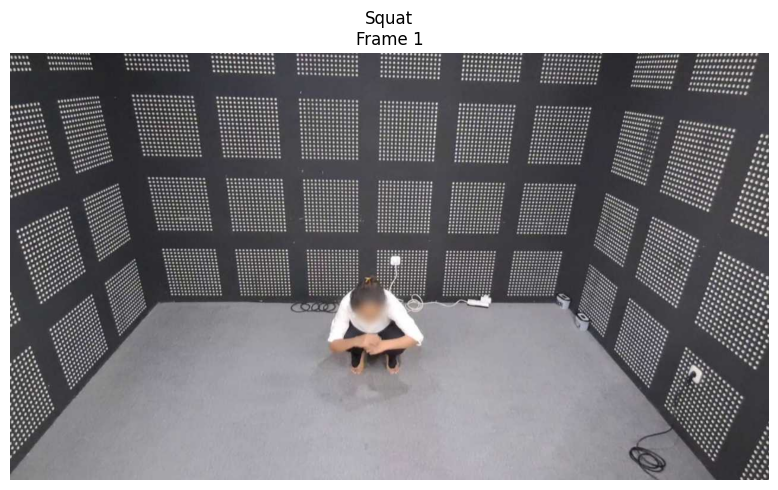

In [8]:
squat = ['/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_squat/frame043.jpg']
plot_images(squat, 'Squat')

karakteristik dari *Squat* mirip dengan jumping. Namun, *squat* ditandai dengan individu yang sedang jongkok, seperti yang terlihat di gambar di atas.

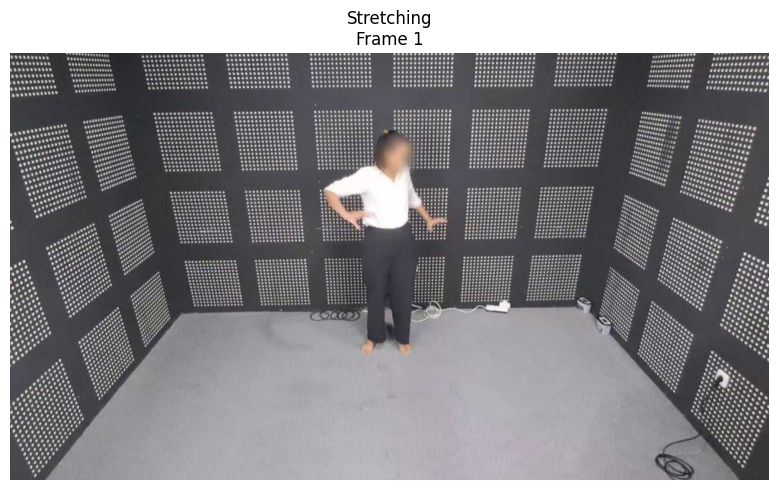

In [9]:
stretch = ['/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_stretching/frame028.jpg']
plot_images(stretch, 'Stretching')

Individu yang melakukan *stretching* akan berdiri diam di tempat dan hanya tangan atau kepala yang bergerak

### Insight mengenai sumber foto

Kami menemukan temuan unik dimana ternyata foto-foto yang terdapat di keseluruhan dataset sebenarnya merupakan potongan frame-frame dari sebuah video yang berkelanjutan.

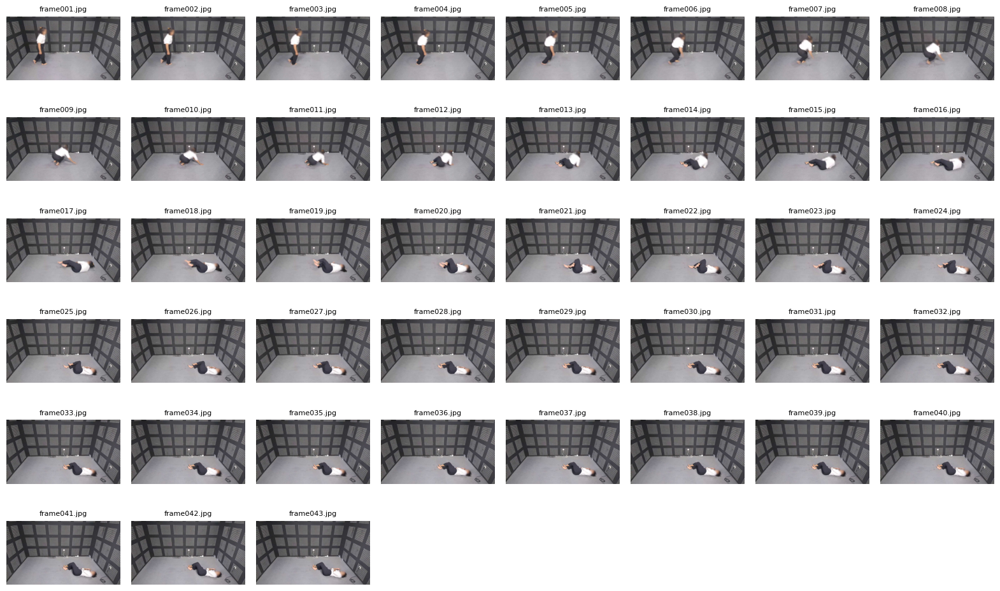

In [41]:
import os
from PIL import Image
import matplotlib.pyplot as plt

folder_path = '/kaggle/input/data-slayer-dataset/train/subject-2/fall/2_forward_falls'

image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

image_files = sorted(image_files)

images_per_row = 8

num_rows = (len(image_files) + images_per_row - 1) // images_per_row  

plt.figure(figsize=(20, num_rows * 2)) 

for i, image_file in enumerate(image_files):
    image_path = os.path.join(folder_path, image_file)
    img = Image.open(image_path)
    
    plt.subplot(num_rows, images_per_row, i + 1)
    plt.imshow(img)
    plt.axis('off') 
    plt.title(image_file, fontsize=8) 
    
plt.subplots_adjust(wspace=0.1, hspace=0.2)  
plt.show()

# Preprocessing

## Importing Dependencies

In [4]:
!pip install tqdm
!pip install ultralytics
!pip install mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 903.1/903.1 kB 15.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 46.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.6/294.6 kB 17.4 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 18.1.0 which is incompatible.
google-api-core 1.34.1 requires protobuf!=3.20.0,!=3.20.1,!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<4.0.0dev,>=3.19.5, but you have protobuf 4.25.5 which is incompatible.
google-cloud-bigtable 2.26.0 requires google-api-core[grpc]<3.0.0dev,>=2.16.0, but you have google-api-core 1.34.

In [5]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping
from ultralytics import YOLO
import cv2
from tqdm import tqdm 
import torch
import torchvision.transforms as T
from torchvision import models
from PIL import Image
import shutil 
import zipfile 
import os
import cv2
import numpy as np
import mediapipe as mp
from ultralytics import YOLO
from tqdm import tqdm  # For progress visualization
import torch
import torchvision
from torchvision import transforms
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
tf.debugging.set_log_device_placement(True) 

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Num GPUs Available:  0


## Peningkatan Kualitas Gambar

Berdasarkan informasi foto di data Train ataupun Test, foto berukuran 1280 x 720 piksel. Selain itu, foto diambil dari frame di video dan hal ini menyebabkan kualitas dari foto itu menurun. Oleh karena itu, kami melakukan peningkatan kualitas gambar dengan model Real-ERSGAN (Real-Enhanced Super-Resolution Generative Adversarial Network). Model ini menggunakan jaringan berbasis deep learning yang dilatih pada beragam dataset untuk menghasilkan gambar dengan resolusi tinggi dari input beresolusi rendah, bahkan untuk kondisi gambar dunia nyata yang kompleks.

Keunggulan utama Real-ESRGAN terletak pada kemampuannya dalam menghasilkan detail visual yang tajam dan realistis. Dibandingkan metode super-resolution lainnya, Real-ESRGAN secara khusus dirancang untuk menangani gambar dengan artefak noise, blur, atau kompresi berlebihan yang sering ditemukan pada gambar dunia nyata. Model ini menggunakan arsitektur GAN yang memungkinkan jaringan untuk mempelajari pola-pola tekstur alami, sehingga hasil gambar tidak hanya lebih tajam tetapi juga terlihat alami.

### Setting Up Environment Untuk Real-ERSGAN (Harus menurunkan versi CUDA)

In [ ]:
!git clone https://github.com/xinntao/Real-ESRGAN.git
%cd Real-ESRGAN
!pip install basicsr
!pip install facexlib
!pip install gfpgan
!pip install -r requirements.txt
!python setup.py develop

In [ ]:
!wget https://github.com/xinntao/Real-ESRGAN/releases/download/v0.1.0/RealESRGAN_x4plus.pth -P weights

In [ ]:
!pip uninstall -y torch torchvision torchaudio
!pip install torch==2.0.1+cu117 torchvision==0.15.2+cu117 torchaudio==2.0.2+cu117 --extra-index-url https://download.pytorch.org/whl/cu117

In [ ]:
import torch
import torchvision

print("Torch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA tersedia:", torch.cuda.is_available())
print("Versi CUDA:", torch.version.cuda)

In [ ]:
!python inference_realesrgan.py -n RealESRGAN_x4plus -i input_image.jpg --outscale 4 --face_enhance

### Import Library

In [ ]:
import os
from tqdm import tqdm
import cv2
import torch
from basicsr.archs.rrdbnet_arch import RRDBNet
from realesrgan import RealESRGANer
import shutil  

### Train Enhancing Quality

In [ ]:
base_input_polos = '/kaggle/input/data-slayer-dataset/train'
fall_activities = [
    'backward_falls',
    'forward_falls',
    'left_falls',
    'right_falls',
    'sitting_falls',
    'standing_falls'
]

non_fall_activities = [
    'jumping',
    'laying',
    'picking',
    'squat',
    'stretching',
    'walking'
]

base_output_dir = '/kaggle/working/output'  

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Menggunakan device: {device}")

model = RRDBNet(
    num_in_ch=3, 
    num_out_ch=3, 
    num_feat=64, 
    num_block=23, 
    num_grow_ch=32, 
    scale=4
).to(device)

upsampler = RealESRGANer(
    scale=4,
    model_path='weights/RealESRGAN_x4plus.pth', 
    model=model,
    tile=0,
    tile_pad=10,
    pre_pad=0,
    half=True,
    device=device
)

failed_crops = []

for subject_num in range(1, 5):
    subject_name = f'subject-{subject_num}'
    subject_input_dir = os.path.join(base_input_polos, subject_name)
    subject_output_dir = os.path.join(base_output_dir, subject_name)

    if not os.path.exists(subject_input_dir):
        print(f"Input directory {subject_input_dir} not found, skipping...")
        continue

    for category, activities in [('fall', fall_activities), ('non_fall', non_fall_activities)]:
        category_input_dir = os.path.join(subject_input_dir, category)
        category_output_dir = os.path.join(subject_output_dir, category)

        if not os.path.exists(category_input_dir):
            print(f"Input category directory {category_input_dir} not found, skipping...")
            continue
            
        for activity in activities:
            activity_folder_name = f"{subject_num}_{activity}"
            activity_input_dir = os.path.join(category_input_dir, activity_folder_name)
            activity_output_dir = os.path.join(category_output_dir, activity_folder_name)

            if not os.path.exists(activity_input_dir):
                print(f"Activity directory {activity_input_dir} not found, skipping...")
                continue

            os.makedirs(activity_output_dir, exist_ok=True)

            image_files = [f for f in os.listdir(activity_input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if not image_files:
                print(f"No images in {activity_input_dir}, skipping...")
                continue

            for filename in tqdm(image_files, desc=f"Processing {activity_folder_name}"):
                img_path = os.path.join(activity_input_dir, filename)
                img = cv2.imread(img_path)

                if img is None:
                    message = f"Failed to read {filename} in {activity_input_dir}, skipping..."
                    print(message)
                    failed_crops.append(message)
                    continue

                if img.shape[0] == 0 or img.shape[1] == 0:
                    message = f"Image {filename} has zero dimensions, skipping..."
                    print(message)
                    failed_crops.append(message)
                    continue

                try:
                    cropped_img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
                    enhanced_img, _ = upsampler.enhance(cropped_img_rgb, outscale=4)
                    enhanced_img_bgr = cv2.cvtColor(enhanced_img, cv2.COLOR_RGB2BGR)

                except Exception as e:
                    message = f"Error during Real-ESRGAN enhancement for {filename} in {activity_input_dir}: {e}"
                    print(message)
                    failed_crops.append(message)
                    continue
                    
                output_path = os.path.join(activity_output_dir, filename)

                try:
                    success = cv2.imwrite(output_path, enhanced_img_bgr)
                    if not success:
                        message = f"Failed to save enhanced image to {output_path}"
                        print(message)
                        failed_crops.append(message)
                except Exception as e:
                    message = f"Failed to save enhanced image to {output_path}: {e}"
                    print(message)
                    failed_crops.append(message)

output_zip_path = '/kaggle/working/output.zip'  
shutil.make_archive('/kaggle/working/output', 'zip', base_output_dir)

print(f"Direktori output telah dikompres menjadi {output_zip_path}")

### Test Enhancing Quality

In [ ]:
test_input_dir = '/kaggle/input/data-slayer-dataset/test'
base_output_dir = '/kaggle/working/output_test'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Menggunakan device: {device}")

model = RRDBNet(
    num_in_ch=3, 
    num_out_ch=3, 
    num_feat=64, 
    num_block=23, 
    num_grow_ch=32, 
    scale=4
).to(device)

upsampler = RealESRGANer(
    scale=4,
    model_path='weights/RealESRGAN_x4plus.pth', 
    model=model,
    tile=0,
    tile_pad=10,
    pre_pad=0,
    half=True,
    device=device
)

failed_crops = []
test_output_dir = os.path.join(base_output_dir, 'test')
os.makedirs(test_output_dir, exist_ok=True)

if not os.path.exists(test_input_dir):
    print(f"Test directory {test_input_dir} not found, skipping...")
else:
    image_files = [f for f in os.listdir(test_input_dir)
                   if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    
    if not image_files:
        print(f"No images found in {test_input_dir}, skipping...")
    else:
        for filename in tqdm(image_files, desc="Processing Test Images"):
            img_path = os.path.join(test_input_dir, filename)
            img = cv2.imread(img_path)

            if img is None:
                message = f"Failed to read {filename} in {test_input_dir}, skipping..."
                print(message)
                failed_crops.append(message)
                continue

            if img.shape[0] == 0 or img.shape[1] == 0:
                message = f"Image {filename} has zero dimensions, skipping..."
                print(message)
                failed_crops.append(message)
                continue
                
            try:
                cropped_img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                enhanced_img, _ = upsampler.enhance(cropped_img_rgb, outscale=4)
                enhanced_img_bgr = cv2.cvtColor(enhanced_img, cv2.COLOR_RGB2BGR)

            except Exception as e:
                message = f"Error during Real-ESRGAN enhancement for {filename} in {test_input_dir}: {e}"
                print(message)
                failed_crops.append(message)
                continue

            output_path = os.path.join(test_output_dir, filename)

            try:
                success = cv2.imwrite(output_path, enhanced_img_bgr)
                if not success:
                    message = f"Failed to save enhanced image to {output_path}"
                    print(message)
                    failed_crops.append(message)
            except Exception as e:
                message = f"Failed to save enhanced image to {output_path}: {e}"
                print(message)
                failed_crops.append(message)

output_zip_path = '/kaggle/working/output_test.zip'
shutil.make_archive('/kaggle/working/output_test', 'zip', base_output_dir)

print(f"Direktori output telah dikompres menjadi {output_zip_path}")

#### Result Before and After Enhancing Quality

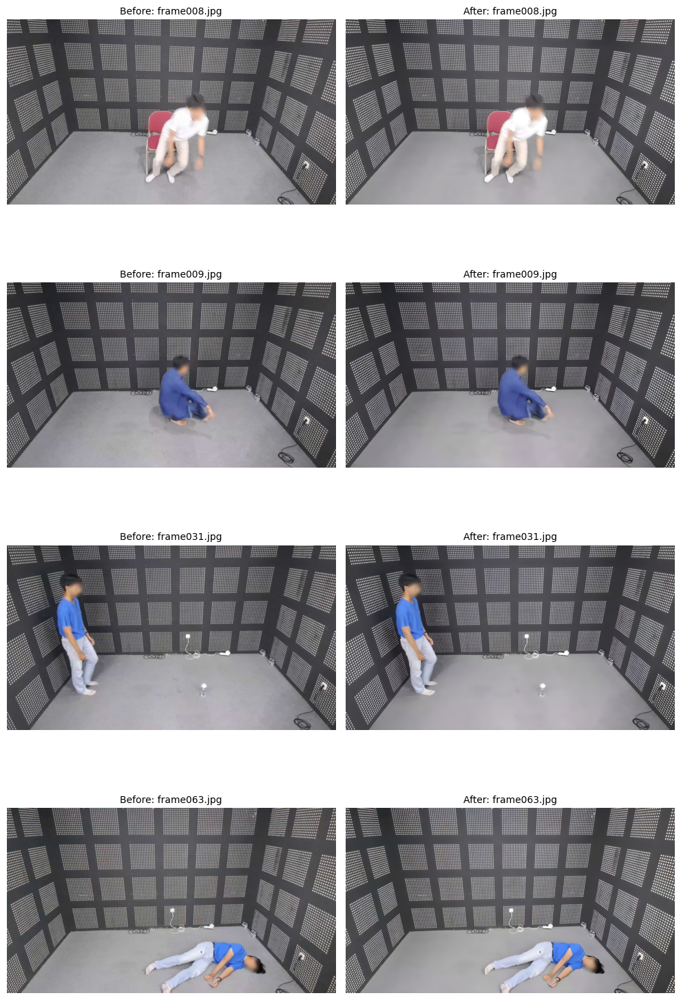

In [2]:
image_pairs = [
    ("/kaggle/input/data-slayer-dataset/train/subject-3/fall/3_sitting_falls/frame008.jpg",
     "/kaggle/input/high-quality/bagus/frame008.jpg"),
    ("/kaggle/input/data-slayer-dataset/train/subject-1/fall/1_backward_falls/frame009.jpg",
     "/kaggle/input/high-quality/bagus/frame009.jpg"),
    ("/kaggle/input/data-slayer-dataset/train/subject-4/non_fall/4_picking/frame031.jpg",
     "/kaggle/input/high-quality/bagus/frame031.jpg"),
    ("/kaggle/input/data-slayer-dataset/train/subject-4/fall/4_standing_falls/frame063.jpg",
     "/kaggle/input/high-quality/bagus/frame063.jpg")
]

def plot_image_pairs_with_less_gap(image_pairs):
    plt.figure(figsize=(10, len(image_pairs) * 4))  
    for i, (before_path, after_path) in enumerate(image_pairs):
        if os.path.exists(before_path):
            before_img = Image.open(before_path)
            plt.subplot(len(image_pairs), 2, 2 * i + 1)
            plt.imshow(before_img)
            plt.axis('off')
            plt.title(f"Before: {os.path.basename(before_path)}", fontsize=10)
        else:
            print(f"Image not found: {before_path}")
            
        if os.path.exists(after_path):
            after_img = Image.open(after_path)
            plt.subplot(len(image_pairs), 2, 2 * i + 2)
            plt.imshow(after_img)
            plt.axis('off')
            plt.title(f"After: {os.path.basename(after_path)}", fontsize=10)
        else:
            print(f"Image not found: {after_path}")
    
    plt.tight_layout(h_pad=0.5) 
    plt.show()

plot_image_pairs_with_less_gap(image_pairs)

Dapat terlihat bahwa foto kedua menghilangkan noise yang ada sehingga gambar atau objek tubuh dari manusia bisa terlihat lebih jelas

## Object Detection

Berdasarkan pengamatan yang telah kami jelaskan sebelumnya di bagian overview, object memegang peranan penting terhadap task klasifikasi ini. Deteksi objek dapat mengidentifikasi orang/subjek utama dalam gambar, serta benda-benda yang menjadi pendukung. 

### Proses Finetuning Model

Base model yang kami gunakan untuk melakukan deteksi objek adalah model YOLOv11, model yang berbasis convolution ini sudah terbukti memiliki performa yang baik untuk banyak macam dataset, seperti pada MS COCO dimana YOLOv6-L6 mencatatkan box-AP sebesar 57,2%. Model YOLO terdiri dari empat step utama: Residual blocks, Bounding box regression, Intersection Over Unions or IOU for short, dan Non-Maximum Suppression. Keempat step yang dipadukan ini mampu memprediksi objek dengan baik, terutama objek yang terlihat jelas dan berada pada kelas YOLO.

Di samping mencatatkan performa deteksi objek yang baik, sayangnya model base ini masih memiliki keterbatasan. Antara lain kurang banyaknya pilihan kelas-kelas benda yang dapat diidentifikasi dan kemungkinan kesalahan yang tinggi saat memprediksi benda-benda yang tertutupi. Karenanya, kami melakukan fine-tune base model dengan dataset buatan yang terdiri dari data train yang telah kami anotasi manual. Akibatnya, model jadi lebih tepat dalam melakukan deteksi objek.

In [ ]:
model_deteksi_objek = YOLO("yolo11x.pt")
results = model_deteksi_objek.train(data='/kaggle/input/dataslayer-anotasi-objek', epochs=10, imgsz=224)

### Deteksi objek yang akan diambil saat gerakan Picking


image 1/1 /kaggle/input/data-slayer-dataset/train/subject-3/non_fall/3_picking/frame001.jpg: 384x640 1 person, 1 backpack, 1548.9ms
Speed: 11.2ms preprocess, 1548.9ms inference, 21.6ms postprocess per image at shape (1, 3, 384, 640)


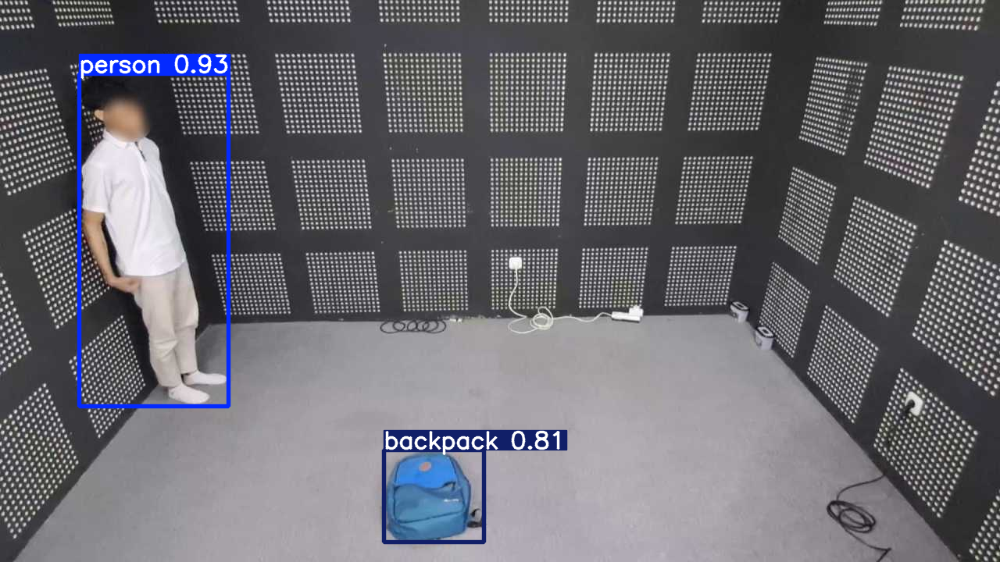

In [7]:
results = model_deteksi_objek('/kaggle/input/data-slayer-dataset/train/subject-3/non_fall/3_picking/frame001.jpg')
for result in results:
    result.show()

### Deteksi kursi saat gerakan sitting fall


image 1/1 /kaggle/input/data-slayer-dataset/train/subject-2/fall/2_sitting_falls/frame013.jpg: 384x640 1 person, 1 chair, 1377.8ms
Speed: 2.3ms preprocess, 1377.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


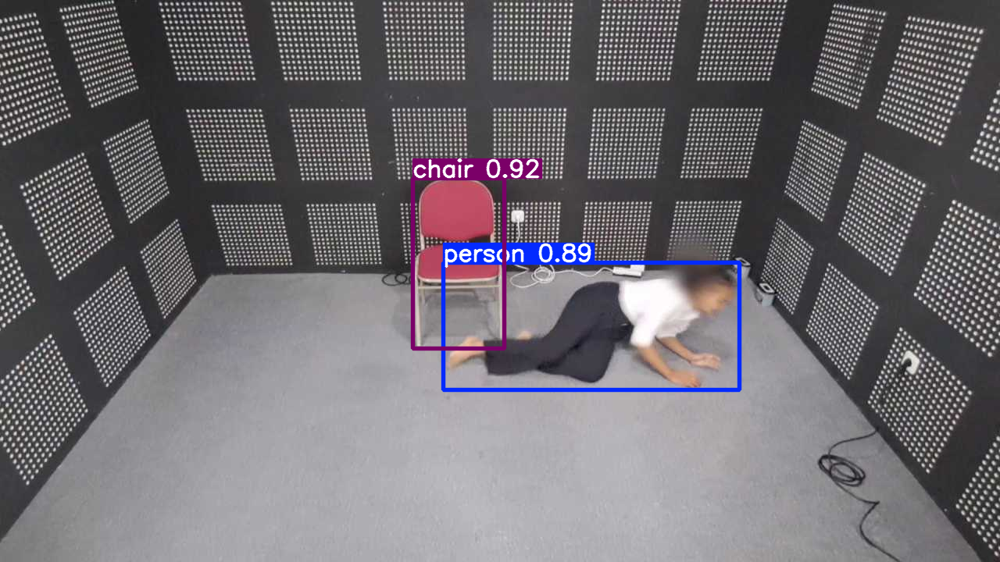

In [8]:
results = model_deteksi_objek('/kaggle/input/data-slayer-dataset/train/subject-2/fall/2_sitting_falls/frame013.jpg')
for result in results:
    result.show()

## Skeleton Tracking

Kami melakukan tracking pada subjek untuk mengidentifikasi posisi bagian tubuh atau pose yang ditampilkan. Proses ini bertujuan untuk membantu mempertajam model dalam memahami hubungan posisi-posisi tubuh terhadap klasifikasi jatuh. Menggunakan model YOLOv11 yang sudah difinetune untuk mendeteksi pose, model tersebut dapat digunakan untuk keperluan skeleton tracking.

100%|██████████| 113M/113M [00:00<00:00, 237MB/s] 



image 1/1 /kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_stretching/frame017.jpg: 384x640 1 person, 1472.8ms
Speed: 2.2ms preprocess, 1472.8ms inference, 4.0ms postprocess per image at shape (1, 3, 384, 640)


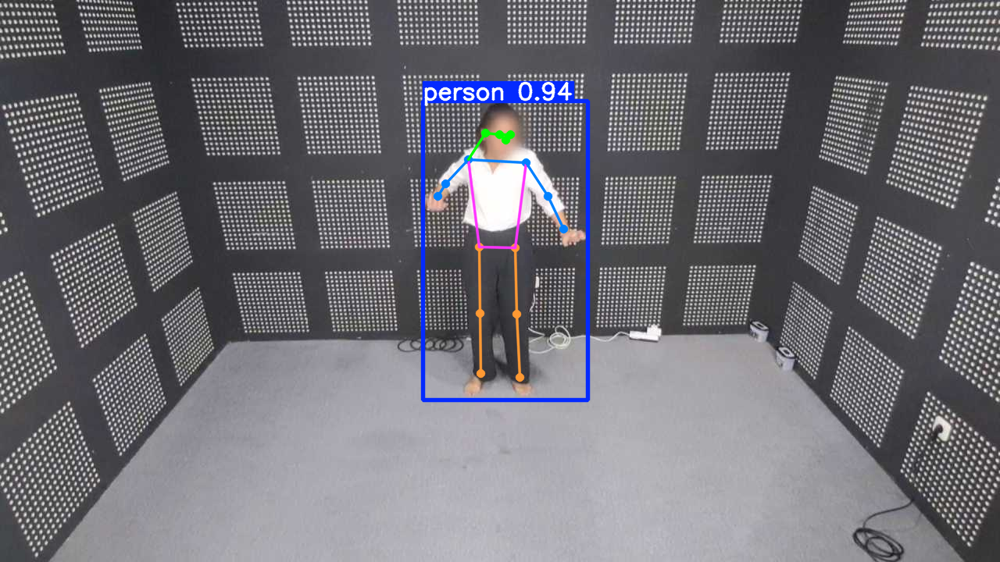

In [9]:
model = YOLO("yolo11x-pose.pt")
results = model('/kaggle/input/data-slayer-dataset/train/subject-2/non_fall/2_stretching/frame017.jpg')
for result in results:
    result.show()

## Cropping Gambar

Kami melakukan cropping pada gambar untuk mengevaluasi tingkat performa model dalam mengenali objek manusia, meskipun terdapat distorsi atau blur pada bagian tertentu, seperti kepala. Proses ini bertujuan untuk menguji ketahanan dan akurasi model dalam mendeteksi objek pada kondisi gambar yang kurang ideal. Dalam penelitian ini, kami menggunakan beberapa metode deteksi objek, yaitu YOLO, MediaPipe, dan Faster R-CNN, yang kemudian digabungkan melalui pendekatan ensemble untuk meningkatkan keakuratan dan keandalan deteksi. Apabila pengujian ini berhasil, maka dapat disimpulkan bahwa meskipun kepala pada gambar terlihat buram, model tetap mampu mengenali objek manusia dengan baik, menunjukkan keunggulan dari pendekatan ensemble yang digunakan dalam sistem deteksi ini.

In [ ]:
yolo_model = YOLO('yolov8n.pt')  

mp_pose = mp.solutions.pose
pose = mp_pose.Pose(static_image_mode=True, min_detection_confidence=0.5)

fasterrcnn_model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
fasterrcnn_model.eval() 

device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
yolo_model.to(device)
fasterrcnn_model.to(device)

In [ ]:

def crop_to_fixed_size(img, x, y, w, h, margin=0.3, target_size=224):
    try:
        img_h, img_w = img.shape[:2]
        margin_w = int(w * margin)
        margin_h = int(h * margin)

        new_x = max(x - margin_w, 0)
        new_y = max(y - margin_h, 0)
        new_w = min(w + 2 * margin_w, img_w - new_x)
        new_h = min(h + 2 * margin_h, img_h - new_y)
        
        if new_x + new_w > img_w or new_y + new_h > img_h:
            print(f"[Crop Error] Crop coordinates out of image bounds: ({new_x}, {new_y}, {new_w}, {new_h})")
            return None

        cropped_img = img[new_y:new_y + new_h, new_x:new_x + new_w]

        if cropped_img.size == 0:
            print(f"[Crop Error] Cropped image is empty for coordinates: ({new_x}, {new_y}, {new_w}, {new_h})")
            return None

        h_cropped, w_cropped = cropped_img.shape[:2]
        scale = target_size / max(w_cropped, h_cropped)
        resized_img = cv2.resize(cropped_img, (int(w_cropped * scale), int(h_cropped * scale)), interpolation=cv2.INTER_AREA)

        delta_w = target_size - resized_img.shape[1]
        delta_h = target_size - resized_img.shape[0]
        top, bottom = delta_h // 2, delta_h - (delta_h // 2)
        left, right = delta_w // 2, delta_w - (delta_w // 2)

        color = [0, 0, 0]  
        fixed_size_img = cv2.copyMakeBorder(resized_img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)

        return fixed_size_img
        
    except Exception as e:
        print(f"[Crop Exception] Error during cropping and resizing: {e}")
        return None

def default_crop_fixed_size(img, target_size=224):
    try:
        img_h, img_w = img.shape[:2]
        center_x, center_y = img_w // 2, img_h // 2
        crop_size = min(img_w, img_h)
        x1 = max(center_x - crop_size // 2, 0)
        y1 = max(center_y - crop_size // 2, 0)
        x2 = x1 + crop_size
        y2 = y1 + crop_size

        cropped_img = img[y1:y2, x1:x2]
        fixed_size_img = cv2.resize(cropped_img, (target_size, target_size), interpolation=cv2.INTER_AREA)

        return fixed_size_img
    except Exception as e:
        print(f"[Default Crop Exception] Error during default cropping: {e}")
        return None

In [ ]:
def detect_person_yolo(img, person_class_id=0, conf_threshold=0.5):
    results = yolo_model(img)
    person_boxes = []

    for result in results:
        boxes = result.boxes
        for box in boxes:
            cls = int(box.cls[0])
            conf = float(box.conf[0])
            if cls == person_class_id and conf >= conf_threshold:
                x1, y1, x2, y2 = box.xyxy[0].tolist()
                person_boxes.append((x1, y1, x2, y2, conf, cls))

    return person_boxes

def detect_person_mediapipe(img):
    results = pose.process(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    person_boxes = []

    if results.pose_landmarks:
        h, w, _ = img.shape
        landmarks = results.pose_landmarks.landmark
        x_coords = [landmark.x for landmark in landmarks]
        y_coords = [landmark.y for landmark in landmarks]
        x_min = int(min(x_coords) * w)
        y_min = int(min(y_coords) * h)
        x_max = int(max(x_coords) * w)
        y_max = int(max(y_coords) * h)
        confidence = 0.9
        person_boxes.append((x_min, y_min, x_max, y_max, confidence, 0))

    return person_boxes

def detect_person_fasterrcnn(img, person_class_id=1, conf_threshold=0.5):
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])
    img_tensor = transform(img).to(device)

    with torch.no_grad():
        predictions = fasterrcnn_model([img_tensor])

    person_boxes = []
    for idx, score in enumerate(predictions[0]['scores']):
        if score >= conf_threshold and predictions[0]['labels'][idx] == person_class_id:
            bbox = predictions[0]['boxes'][idx].cpu().numpy()
            x1, y1, x2, y2 = bbox
            conf = score.cpu().numpy()
            person_boxes.append((x1, y1, x2, y2, conf, person_class_id))

    return person_boxes

def detect_person_ensemble(img, conf_threshold=0.5):
    person_boxes_yolo = detect_person_yolo(img, conf_threshold=conf_threshold)
    person_boxes_mediapipe = detect_person_mediapipe(img)
    person_boxes_fasterrcnn = detect_person_fasterrcnn(img, conf_threshold=conf_threshold)
    combined_boxes = person_boxes_yolo + person_boxes_mediapipe + person_boxes_fasterrcnn
    return combined_boxes

In [ ]:
base_input_dir = '/kaggle/input/data-slayer-dataset/train'
base_output_dir = '/kaggle/working/cropped_version_fixed'

os.makedirs(base_output_dir, exist_ok=True)

fall_activities = [
    'backward_falls',
    'forward_falls',
    'left_falls',
    'right_falls',
    'sitting_falls',
    'standing_falls'
]

non_fall_activities = [
    'jumping',
    'laying',
    'picking',
    'squat',
    'stretching',
    'walking'
]

In [ ]:
person_class_id_yolo = 0
person_class_id_fasterrcnn = 1
conf_threshold = 0.5

failed_crops = []

for subject_num in range(1, 5):
    subject_name = f'subject-{subject_num}'
    subject_input_dir = os.path.join(base_input_dir, subject_name)
    subject_output_dir = os.path.join(base_output_dir, subject_name)

    if not os.path.exists(subject_input_dir):
        print(f"Input directory {subject_input_dir} not found, skipping...")
        continue

    # Loop through each category
    for category, activities in [('fall', fall_activities), ('non_fall', non_fall_activities)]:
        category_input_dir = os.path.join(subject_input_dir, category)
        category_output_dir = os.path.join(subject_output_dir, category)

        if not os.path.exists(category_input_dir):
            print(f"Input category directory {category_input_dir} not found, skipping...")
            continue

        for activity in activities:
            activity_folder_name = f"{subject_num}_{activity}"
            activity_input_dir = os.path.join(category_input_dir, activity_folder_name)
            activity_output_dir = os.path.join(category_output_dir, activity_folder_name)

            if not os.path.exists(activity_input_dir):
                print(f"Activity directory {activity_input_dir} not found, skipping...")
                continue

            os.makedirs(activity_output_dir, exist_ok=True)

            image_files = [f for f in os.listdir(activity_input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if not image_files:
                print(f"No images in {activity_input_dir}, skipping...")
                continue

            for filename in tqdm(image_files, desc=f"Processing {activity_folder_name}"):
                img_path = os.path.join(activity_input_dir, filename)
                img = cv2.imread(img_path)

                if img is None:
                    print(f"Failed to read {filename} in {activity_input_dir}, skipping...")
                    continue

                if img.shape[0] == 0 or img.shape[1] == 0:
                    print(f"Image {filename} has zero dimensions, skipping...")
                    continue

                person_boxes = detect_person_ensemble(img, conf_threshold=conf_threshold)

                if not person_boxes:
                    message = f"No person detected in {filename} in {activity_input_dir}"
                    print(message)
                    failed_crops.append(message)

                    try:
                        print(f"Applying default cropping to {filename}")
                        cropped_img = default_crop_fixed_size(img, target_size=224)  # Adjust target_size as needed

                        if cropped_img is None:
                            message = f"Failed to apply default cropping to {filename} in {activity_input_dir}"
                            print(message)
                            failed_crops.append(message)
                            continue
                    except Exception as e:
                        message = f"Error during default cropping {filename} in {activity_input_dir}: {e}"
                        print(message)
                        failed_crops.append(message)
                        continue
                else:
                    person_boxes.sort(key=lambda b: b[4], reverse=True)
                    best_box = person_boxes[0]
                    x1, y1, x2, y2, conf, cls = best_box

                    x, y = int(x1), int(y1)
                    w = int(x2 - x1)
                    h = int(y2 - y1)

                    try:
                        print(f"Cropping {filename} with coordinates: x={x}, y={y}, w={w}, h={h}")
                        cropped_img = crop_to_fixed_size(img, x, y, w, h, margin=0.2, target_size=224)  # Adjust target_size as needed

                        if cropped_img is None:
                            message = f"Failed to crop {filename} in {activity_input_dir}"
                            print(message)
                            failed_crops.append(message)
                            continue
                    except Exception as e:
                        message = f"Error during cropping {filename} in {activity_input_dir}: {e}"
                        print(message)
                        failed_crops.append(message)
                        continue

                output_path = os.path.join(activity_output_dir, filename)
                try:
                    success = cv2.imwrite(output_path, cropped_img)
                    if not success:
                        message = f"Failed to save cropped image to {output_path}"
                        print(message)
                        failed_crops.append(message)
                except Exception as e:
                    message = f"Failed to save cropped image to {output_path}: {e}"
                    print(message)
                    failed_crops.append(message)


### Performa Model dalam mendeteksi Objek

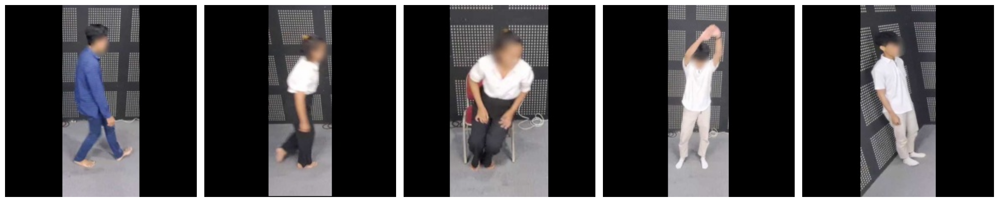

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_paths = [
    "/kaggle/input/cropped/subject-1/fall/1_backward_falls/frame001.jpg",
    "/kaggle/input/cropped/subject-2/fall/2_forward_falls/frame002.jpg",
    "/kaggle/input/cropped/subject-2/fall/2_sitting_falls/frame003.jpg",
    "/kaggle/input/cropped/subject-3/non_fall/3_stretching/frame020.jpg",
    "/kaggle/input/cropped/subject-3/non_fall/3_walking/frame011.jpg"
]

fig, axes = plt.subplots(1, 5, figsize=(20, 5))
for ax, path in zip(axes, image_paths):
    img = mpimg.imread(path)
    ax.imshow(img)
    ax.axis('off') 
plt.tight_layout()
plt.show()

Model tidak mengalami kesulitan dalam mengenali objek manusia walaupun bagian kepala di blur

# Modelling

Setelah mempelajari dataset gambar, kami memiliki beberapa rencana untuk modeling. Namun kami memilih model CBAM resnet, mengingat model satu ini cukup *robust* dan untuk model pretrained nya sudah sangat bagus. Sebelum train kami, mengolah terlebih dahulu input datasetnya. Berikut praproses dari dataset:

In [1]:
import os
import torch
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.models import resnet50
import pandas as pd
from PIL import Image

In [2]:
# Mendefinisikan kelas dataset tersendiri 
class FallDetectionDataset(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# Direktori input
base_input_dir = '/kaggle/input/data-slayer-dataset/train'

# Pengelompokkan aktivitas
fall_activities = [
    'backward_falls',
    'forward_falls',
    'left_falls',
    'right_falls',
    'sitting_falls',
    'standing_falls'
]

non_fall_activities = [
    'jumping',
    'laying',
    'picking',
    'squat',
    'stretching',
    'walking'
]

Untuk tiap unit gambar, path dan label akan disimpan. Label disini adalah pengkategorian antara 1/fall atau 0/non_fall sesuai keterangan pada direktori masing-masing.  

In [3]:
image_paths = []
labels = []

# Data preparation
for subject_num in range(1, 5):
    subject_name = f'subject-{subject_num}'
    subject_input_dir = os.path.join(base_input_dir, subject_name)

    if not os.path.exists(subject_input_dir):
        print(f"Input directory {subject_input_dir} not found, skipping...")
        continue

    for category, activities in [('fall', fall_activities), ('non_fall', non_fall_activities)]:
        category_input_dir = os.path.join(subject_input_dir, category)

        if not os.path.exists(category_input_dir):
            print(f"Input category directory {category_input_dir} not found, skipping...")
            continue

        for activity in activities:
            activity_folder_name = f"{subject_num}_{activity}"
            activity_input_dir = os.path.join(category_input_dir, activity_folder_name)

            if not os.path.exists(activity_input_dir):
                print(f"Activity directory {activity_input_dir} not found, skipping...")
                continue

            image_files = [f for f in os.listdir(activity_input_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

            if not image_files:
                print(f"No images in {activity_input_dir}, skipping...")
                continue

            label = 1 if category == 'fall' else 0

            for filename in image_files:
                img_path = os.path.join(activity_input_dir, filename)
                image_paths.append(img_path)
                labels.append(label)

Berikut transform dan pemuat data yang kami terapkan untuk dataset train. Transformasi yang digunakan yaitu:
- RandomRotation(degrees=15): Secara acak memutar gambar hingga 15 derajat untuk meningkatkan variasi data dan membantu model menjadi lebih robust terhadap rotasi.
- Resize((256, 256)): Mengubah ukuran gambar menjadi 256x256 piksel untuk konsistensi input. Resize lebih cocok dengan model karena tidak menghilangkan informasi pada gambar, jika dibandingkan dengan cropping.
- ToTensor(): Mengubah gambar menjadi tensor PyTorch dengan bentuk (C, H, W) dan nilai piksel yang dinormalisasi ke rentang [0, 1].
- Normalize(mean, std): Menormalkan tensor berdasarkan nilai rata-rata (mean) dan standar deviasi (std) dari dataset ImageNet, sehingga fitur input lebih terpusat dan membantu model pretrained memanfaatkan bobot awalnya dengan optimal. Angka-angka tersebut menyesuaikan model agar optimum.

Adapun untuk batch size pada DataLoader, kami memilih di angka 16, setelah menguji adanya penurunan performa model pada angka 8 dan 32.

In [4]:
transform = transforms.Compose([
    transforms.RandomRotation(degrees=15),
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# dataset dan dataloader
dataset = FallDetectionDataset(image_paths, labels, transform=transform)
dataloader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=2, pin_memory=True)

Mendefinisikan model, yakni resnet50. Model ResNet50 digunakan dengan argumen pretrained=True, yang berarti bobot dari model telah dilatih pada dataset ImageNet. Model dengan paramter ini setara dengan model IMAGENET1K. Lapisan terakhir (model.fc) dari ResNet50, yang default-nya digunakan untuk klasifikasi 1000 kelas, diganti dengan arsitektur yang disesuaikan untuk klasifikasi biner, terdiri dari:
- Linear Layer: Mengurangi dimensi output dari model.fc.in_features menjadi 512.
- ReLU Activation: Menambahkan fungsi aktivasi ReLU untuk non-linearitas. Kami juga bereksperimen dengan SELU, ELU, LeakyReLU, Tanh, dan SiLU. Namun kami menadpati ReLU sudah sangat cocok untuk model kami.
- Dropout: Menggunakan dropout dengan tingkat 40% untuk mengurangi overfitting. Angka ini sudah diatur agar model optimal. Hal ini dibuktikan dengan perfoma model dengan dropout di angka 50% dan 30% kurang baik daripada angka 40%.
- Linear Layer: Lapisan terakhir yang menghasilkan output tunggal untuk tugas klasifikasi biner (output probabilitas atau logit).

Disini kami menghindari untuk memakai layer yang terlalu tebal, dimana pada mayoritas kasus, model menjadi overfit karena dataset tidak terlalu besar. Sehingga kami memutuskan untuk hanya memainkan paramater dan jenis tiap layer, tidak menambahkan layer baru.

In [5]:
model = resnet50(pretrained=True)
model.fc = torch.nn.Sequential(
    torch.nn.Linear(model.fc.in_features, 512),
    torch.nn.ReLU(),
    torch.nn.Dropout(0.40),
    torch.nn.Linear(512, 1)
)
model = model.to('cuda')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 197MB/s] 


Criterion yang kami pilih adalah BCEWithLogitsLoss (Binary Cross Entropy with Logits Loss). Fungsi ini menggabungkan dua langkah, yaitu menghitung sigmoid pada output model sekaligus menghitung binary cross-entropy antara prediksi dan label sebenarnya. Sementara untuk optimizer dipilih Adam dengan learning rate sebesar 0.00001 atau 1e-5. Angka ini didapat dari percobaan untuk menurunkan angka dari 1e-4 menjadi 1e-5 (sekarang), lalu dicoba lagi 1e-6 namun hasilnya model mempelajari dengan sangat lamban sehingga kami memilih learning rate pada angka 1e-5.

In [6]:
criterion = torch.nn.BCEWithLogitsLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)

### Mendefinisikan fungsi untuk training. 

In [7]:
def train_one_epoch(model, dataloader, optimizer, criterion, device):
    model.train()
    running_loss = 0.0

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device).float().unsqueeze(1)

        # Forward pass
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    return running_loss / len(dataloader)

Pada training, hasil loss *epoch* pertama yang didapat sekitar 0.26~0.30. Hal ini merupakan peningkatan dari model yang tanpa penyesuaian layer, transform, dan optimizer. Pada *epoch* kedua, loss yang didapat langsung jatuh turun ke angka sekitar 0.05 dilanjut dengan angka kisaran 0.001 untuk *epoch-epoch* berikutnya. 

Pada training ini terlihat loss yang di peroleh sudah cukup kecil yaitu pada angka 0.0061. Namun kami juga bereksperimen untuk menggali lebih dalam untuk total *epoch* di angka 10, 12 dan 15. Hasilnya, lewat nilai submisi, kami mendapati *epoch* 12 adalah angka yang tepat untuk model kami melakukan training

Sekalipun jika modelnya di *lepas* training ke *epoch* 13 dan seterusnya menghasilkan angka loss yang mendekati angka 0, tetapi hasil submisi berkata lain. Kami menyimpulkan bahwa model akan overfit jika terus di train pada *epoch* lebih dari 12. 

![fig-1](https://imgur.com/h3Y1gSF.jpg)

In [8]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
epochs = 12
for epoch in range(epochs):
    loss = train_one_epoch(model, dataloader, optimizer, criterion, device)
    print(f"Epoch {epoch+1}/{epochs}, Loss: {loss:.4f}")

Epoch 1/12, Loss: 0.2816
Epoch 2/12, Loss: 0.0515
Epoch 3/12, Loss: 0.0192
Epoch 4/12, Loss: 0.0097
Epoch 5/12, Loss: 0.0061
Epoch 6/12, Loss: 0.0055
Epoch 7/12, Loss: 0.0057
Epoch 8/12, Loss: 0.0068
Epoch 9/12, Loss: 0.0031
Epoch 10/12, Loss: 0.0019
Epoch 11/12, Loss: 0.0057
Epoch 12/12, Loss: 0.0045


### Menyiapkan test data serta pemuat datanya

In [10]:
test_dir = '/kaggle/input/data-slayer-dataset/test'
image_paths_test = []
ids_test = []

for root, _, files in os.walk(test_dir):
    for file in files:
        if file.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_paths_test.append(os.path.join(root, file))
            ids_test.append(file)

test_dataset = FallDetectionDataset(image_paths_test, [0]*len(image_paths_test), transform=transform)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

Prediksi data tiap gambar dengan konversi logits ke probabilitas, mengubah output logit menjadi probabilitas dalam rentang [0, 1]. Lalu probabilitas diklasifikasikan menjadi kelas biner berdasarkan ambang batas (threshold) 0.5:
- Nilai probabilitas > 0.5 diklasifikasikan sebagai kelas 1 (fall).
- Nilai probabilitas ≤ 0.5 diklasifikasikan sebagai kelas 0 (non fall).

In [11]:
predictions = []

with torch.no_grad():
    for images, _ in test_dataloader:
        images = images.to(device)
        outputs = model(images)
        preds = (torch.sigmoid(outputs) > 0.5).int().cpu().numpy()
        predictions.extend(preds.flatten().tolist())

### Menyimpan hasil prediksi

In [13]:
submission = pd.DataFrame({'id': ids_test, 'label': predictions})
submission.to_csv('prediction.csv', index=False)
print("Predictions saved to prediction.csv")

Predictions saved to prediction.csv


## Error Analysis

Terdapat beberapa eror yang kami dapati dimana eror ini membuat model *confuse*. 

### Kursi tak nampak dengan jelas
![fig-2](https://imgur.com/0wJZCeT.jpg)


Terlihat pada gambar ini, kursi tertutup oleh peraga, sehingga model mungkin saja memprediksi gambar itu termasuk pada non_fall. Memang gambar tersebut mungkin saja diinterpretasi oleh model sebagai aktivitas duduk biasa, namun karena dari datasetnya, alat peraga kursi hanya muncul pada gambar dengan label fall. Hal ini mengakibatkan model kebingungan. Solusi yang kami lakukan adalah dengan tuning dengan YOLO setelah model resnet memprediksi. Sehingga eror semacam ini bisa ditangani.

### Gerakan ambigu
![fig-3](https://imgur.com/lxuzMtx.jpg)
![fig-4](https://imgur.com/4A8aab7.jpg)
Pada kasus ini, peraga terlihat sedang bergerak. Model dapat saja mengiterpretasi ini sebagai fall, padahal tidak setiap aktivitas yang bergerak (khususnya ke bawah) tergolong ke label non_fall. 

## Confusion Matrix

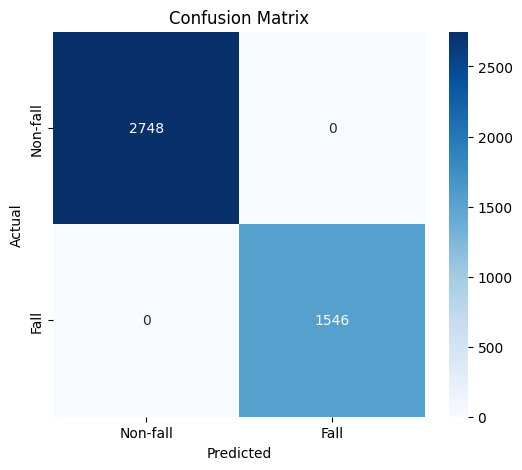

In [15]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

def get_predictions_and_labels(model, dataloader, device):
    model.eval()
    all_predictions = []
    all_labels = []

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device).float().unsqueeze(1)

            outputs = model(images)
            predictions = torch.sigmoid(outputs).cpu().numpy()
            predictions = (predictions > 0.5).astype(int)  

            all_predictions.extend(predictions.flatten())
            all_labels.extend(labels.cpu().numpy().flatten())

    return np.array(all_labels), np.array(all_predictions)

test_labels, test_predictions = get_predictions_and_labels(model, dataloader, device)
cm = confusion_matrix(test_labels, test_predictions)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["Non-fall", "Fall"], yticklabels=["Non-fall", "Fall"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()


Walaupun terdapat error dari hasil prediction, namun confusion matrix menunjukkan bahwa model sudah dengan baik memprediksi fall dan juga non fall